# Graph and mapping libraries in Python

* [networkx](https://networkx.org/)
* [osmnx](https://osmnx.readthedocs.io/en/stable/)
* [GeoPandas](https://geopandas.org/en/stable/)
* [contextily](https://contextily.readthedocs.io/en/latest/)
* [folium](https://python-visualization.github.io/folium/)
* [pyrosm](https://pyrosm.readthedocs.io/en/latest/)
* [Pandana](https://udst.github.io/pandana/)

## networkx

The route of the salesman is: [0, 10, 7, 2, 6, 1, 15, 14, 5, 17, 4, 9, 12, 18, 3, 19, 16, 8, 11, 13, 0]


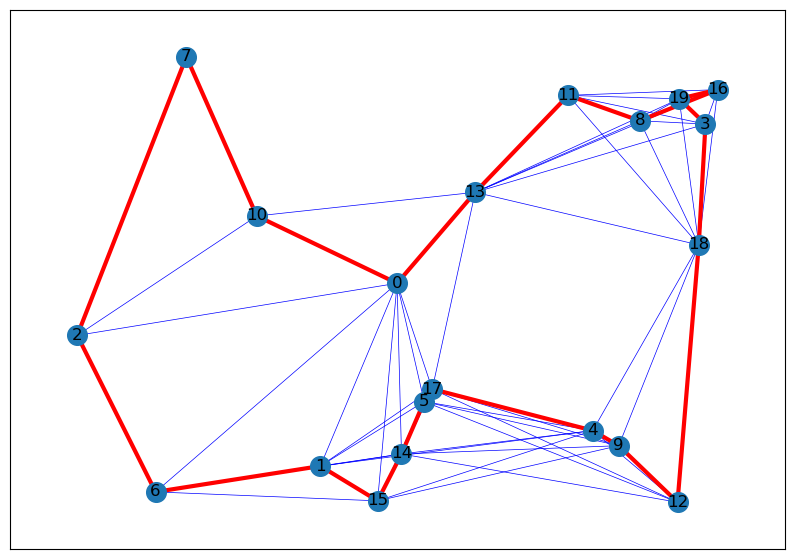

In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import networkx.algorithms.approximation as nx_app
import math

plt.figure(figsize=(10, 7))

# Create a random geometric graph with 20 nodes
G = nx.random_geometric_graph(20, radius=0.4, seed=4)
pos = nx.get_node_attributes(G, "pos")

# Depot should be at (0,0)
pos[0] = (0.5, 0.5)

# Create an independent shallow copy of the graph and attributes
H = G.copy()

# Calculating the distances between the nodes as edge's weight.
for i in range(len(pos)):
    for j in range(i + 1, len(pos)):
        dist = math.hypot(pos[i][0] - pos[j][0], pos[i][1] - pos[j][1]) #square root of the sum of squares
        dist = dist
        G.add_edge(i, j, weight=dist)

# solve tsp using Christofides algorithm 
cycle = nx_app.christofides(G, weight="weight")
edge_list = list(nx.utils.pairwise(cycle))

# Draw closest edges on each node only
nx.draw_networkx_edges(H, pos, edge_color="blue", width=0.5)

# Draw the route
nx.draw_networkx(
    G,
    pos,
    with_labels=True,
    edgelist=edge_list,
    edge_color="red",
    node_size=200,
    width=3,
)

print("The route of the salesman is:", cycle)
plt.show()
# plt.savefig('A1_F01_Christofides.png', format='png', dpi=300)

## osmnx

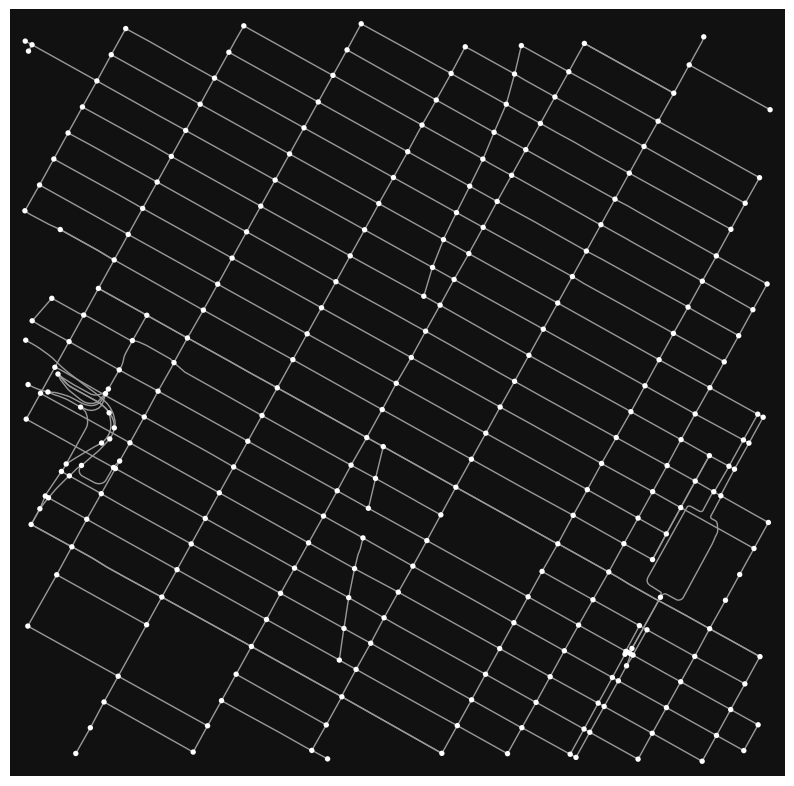

(<Figure size 1000x1000 with 1 Axes>, <AxesSubplot: >)

In [2]:
import osmnx as ox

place_name = "Times Square, NY"


# networkx graph of the named place
graph = ox.graph_from_address(place_name, network_type='drive')

# Plot the graphs
ox.plot_graph(graph,figsize=(10,10), save=True, filepath='A1_F02_TimesSquare.png')

In [3]:
# type of the graph
type(graph)

networkx.classes.multidigraph.MultiDiGraph

In [4]:
# extract the nodes and the edges of the graph
nodes, edges = ox.graph_to_gdfs(graph)

#print first 5 nodes
nodes.head(5)

,y,x,street_count,highway,geometry
osmid,,,,,
42423836,40.759388,-73.996954,3,NaN,POINT (-73.99695 40.75939)
42423885,40.757729,-73.996857,4,traffic_signals,POINT (-73.99686 40.75773)
42424789,40.757665,-73.994811,4,traffic_signals,POINT (-73.99481 40.75767)
42427764,40.763926,-73.974136,3,traffic_signals,POINT (-73.97414 40.76393)
42427812,40.749054,-73.995730,4,traffic_signals,POINT (-73.99573 40.74905)


In [5]:
#print first 5 edges
edges.head(5)

osmid  oneway   lanes  \
u        v          key                                             
42423836 42446506   0                     5669227    True       2   
42423885 42446504   0    [1041012064, 1041012063]    True  [5, 6]   
42424789 42434434   0                    46492638    True       5   
         42444991   0      [847002232, 273895450]    True       3   
42427812 4443775464 0                  1027181003    True       4   

                                     name      highway maxspeed  reversed  \
u        v          key                                                     
42423836 42446506   0       Galvin Avenue    secondary   25 mph     False   
42423885 42446504   0         10th Avenue      primary   25 mph     False   
42424789 42434434   0         Dyer Avenue      primary      NaN     False   
         42444991   0    West 40th Street  residential      NaN     False   
42427812 4443775464 0          8th Avenue    secondary   25 mph     False   

                          length  \
u        v          key            
42423836 42446506   0     79.950   
42423885 42446504   0     78.433   
42424789 42434434   0     86.462   
         42444991   0    118.429   
42427812 4443775464 0     78.073   

                                                                  geometry  \
u        v          key                                                      
42423836 42446506   0    LINESTRING (-73.99695 40.75939, -73.99701 40.7...   
42423885 42446504   0    LINESTRING (-73.99686 40.75773, -73.99680 40.7...   
42424789 42434434   0    LINESTRING (-73.99481 40.75767, -73.99478 40.7...   
         42444991   0    LINESTRING (-73.99481 40.75767, -73.99452 40.7...   
42427812 4443775464 0    LINESTRING (-73.99573 40.74905, -73.99569 40.7...   

                           width access bridge tunnel  ref  
u        v          key                                     
42423836 42446506   0        NaN    NaN    NaN    NaN  NaN  
42423885 42446504   0    69.6 ft    NaN    NaN    NaN  NaN  
42424789 42434434   0        NaN    NaN    NaN    NaN  NaN  
         42444991   0        NaN    NaN    NaN    NaN  NaN  
42427812 4443775464 0        NaN    NaN    NaN    NaN  NaN

In [6]:
# examine each individual node or edge.
list(graph.nodes(data=True))[1]

(42423885,
 {'y': 40.7577291,
  'x': -73.996857,
  'highway': 'traffic_signals',
  'street_count': 4})

In [7]:
# Rendering the 1st edge
list(graph.edges(data=True))[0]

(42423836,
 42446506,
 {'osmid': 5669227,
  'oneway': True,
  'lanes': '2',
  'name': 'Galvin Avenue',
  'highway': 'secondary',
  'maxspeed': '25 mph',
  'reversed': False,
  'length': 79.95,
  'geometry': <shapely.geometry.linestring.LineString at 0x29ca395b940>})

In [8]:
print(edges['highway'].value_counts())

secondary                      236
residential                    120
primary                         83
unclassified                    16
motorway_link                   12
tertiary                        10
motorway                         7
living_street                    3
[residential, unclassified]      1
[motorway_link, primary]         1
trunk                            1
Name: highway, dtype: int64


In [9]:
# more statistics
ox.basic_stats(graph)

{'n': 270,
 'm': 490,
 'k_avg': 3.6296296296296298,
 'edge_length_total': 67164.30700000004,
 'edge_length_avg': 137.07001428571436,
 'streets_per_node_avg': 3.8333333333333335,
 'streets_per_node_counts': {0: 0, 1: 1, 2: 2, 3: 40, 4: 225, 5: 2},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.003703703703703704,
  2: 0.007407407407407408,
  3: 0.14814814814814814,
  4: 0.8333333333333334,
  5: 0.007407407407407408},
 'intersection_count': 269,
 'street_length_total': 62744.88100000004,
 'street_segment_count': 466,
 'street_length_avg': 134.64566738197433,
 'circuity_avg': 1.0053745737553006,
 'self_loop_proportion': 0.0}

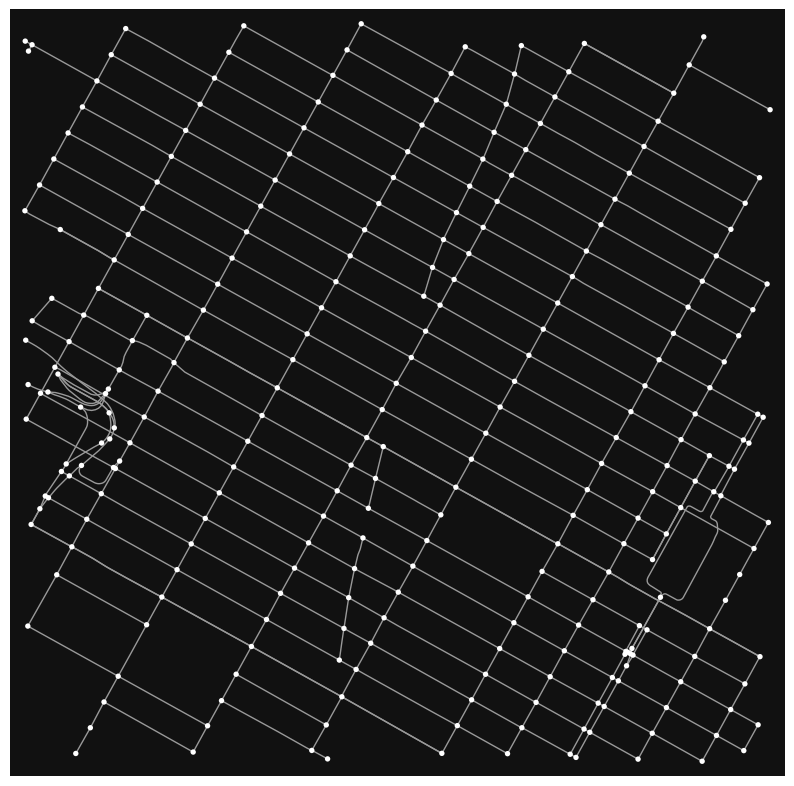

(<Figure size 1000x1000 with 1 Axes>, <AxesSubplot: >)

In [10]:
# GeoDataFrame to MultiDiGraph
new_graph = ox.graph_from_gdfs(nodes,edges)
ox.plot_graph(new_graph,figsize=(10,10))

## GeoPandas

In [11]:
import geopandas as gpd

# file downloaded from https://data.ontario.ca/dataset/ontario-s-health-region-geographic-data
ontario = gpd.read_file(r"../Appendix B/data/OntarioHealth/Ontario_Health_Regions.shp")

ontario

,Shape_Leng,Shape_Area,REGION,REGION_ID,geometry
0,4.845977e+06,1.089122e+11,East,04,"MULTIPOLYGON (((-8631925.914 5449844.839, -863..."
1,3.211510e+07,2.232211e+12,North,05,"MULTIPOLYGON (((-8943097.220 5627248.576, -894..."
2,4.860262e+06,7.543033e+10,West,01,"MULTIPOLYGON (((-9204865.114 5113839.368, -920..."
3,2.755817e+06,3.189867e+10,Central,02,"MULTIPOLYGON (((-8872905.739 5371938.215, -887..."
4,2.196396e+05,3.715020e+08,Toronto,03,"MULTIPOLYGON (((-8839514.979 5425932.689, -883..."


<AxesSubplot: >

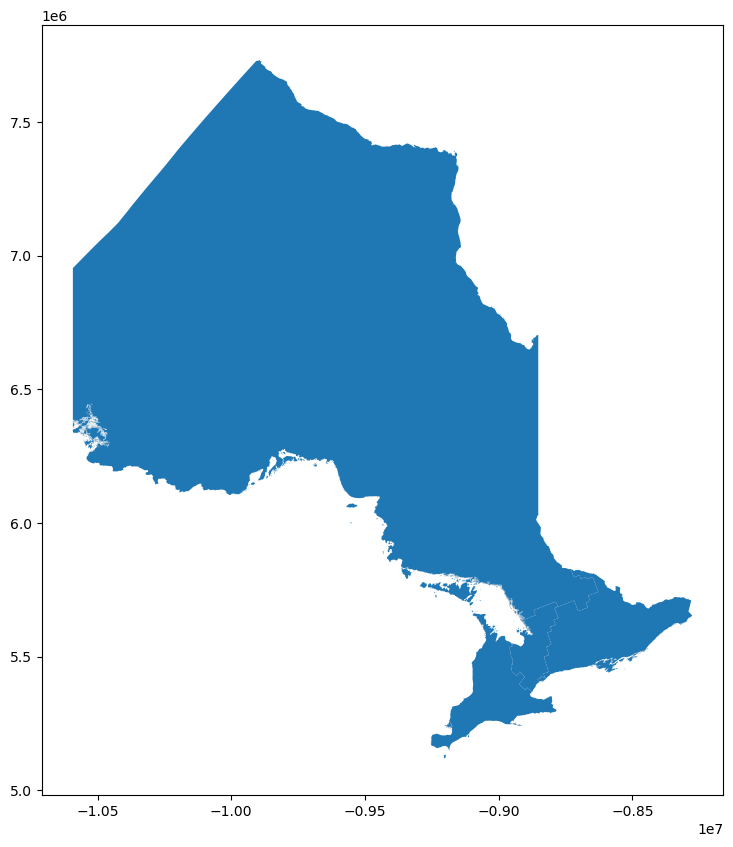

In [12]:
ontario.plot(figsize=(10,10))

Text(0.5, 1.0, 'WGS84 (lat/lon)')

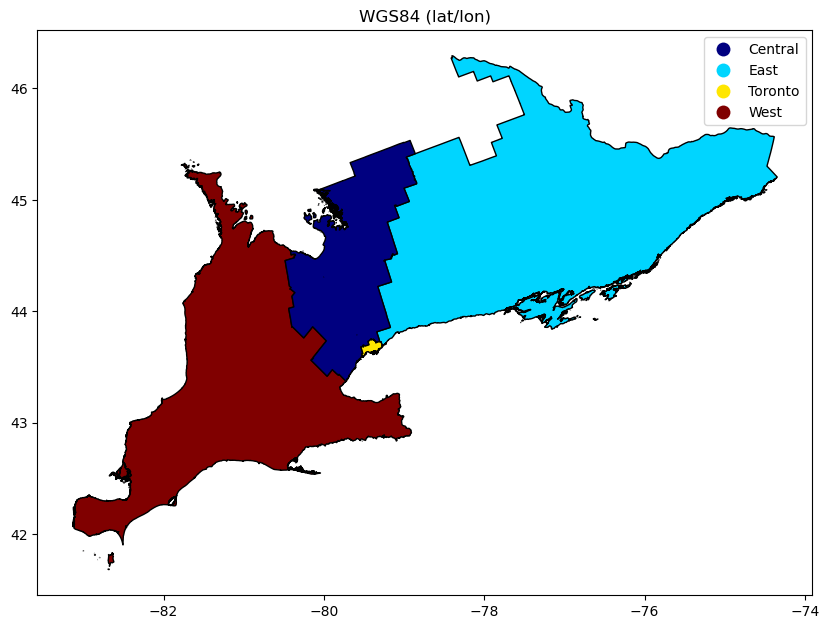

In [13]:
ontario = ontario.to_crs('EPSG:4326')
ontario = ontario[(ontario.REGION != "North")] # exclude Northern Ontario
ax=ontario.plot(cmap='jet', edgecolor='black', column='REGION', figsize=(10,10), legend=True)
ax.set_title('WGS84 (lat/lon)')

## contextily

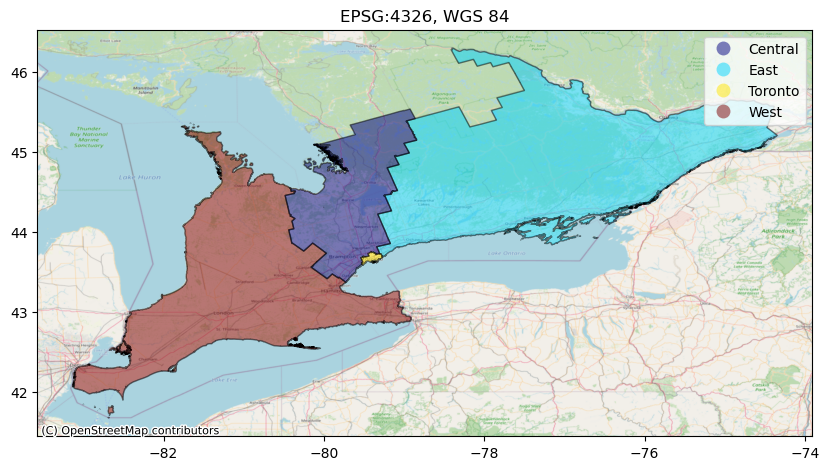

In [14]:
import contextily as ctx

ax=ontario.plot(cmap='jet', edgecolor='black', column='REGION', alpha=0.5, legend=True, figsize=(10,10))
ax.set_title("EPSG:4326, WGS 84")
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ontario.crs.to_string())

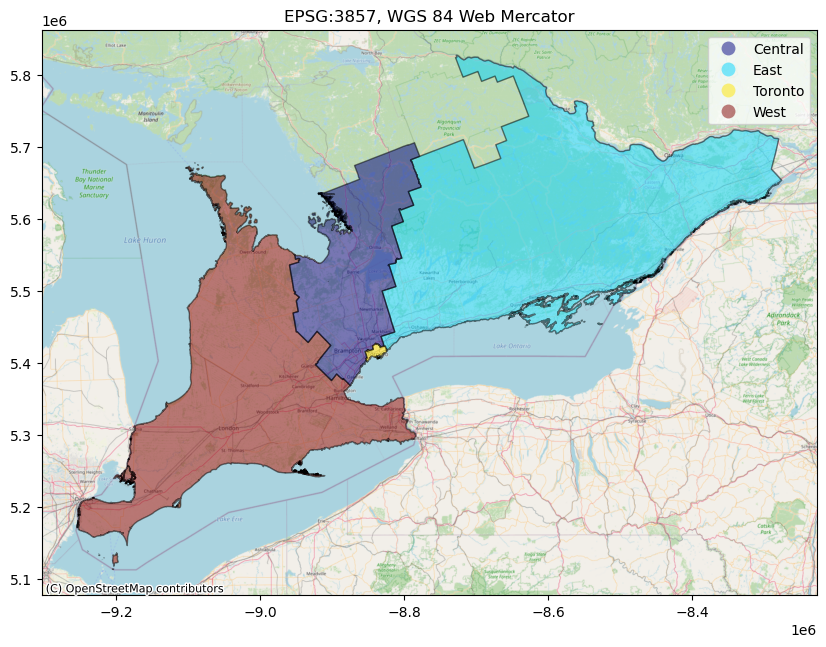

In [15]:
ontario = ontario.to_crs(epsg=3857) 
ax2=ontario.plot(cmap='jet', edgecolor='black', column='REGION', alpha=0.5, legend=True, figsize=(10,10))
ax2.set_title("EPSG:3857, WGS 84 Web Mercator")
ctx.add_basemap(ax2, source=ctx.providers.OpenStreetMap.Mapnik)

## Visualization using folium

In [16]:
import geopandas as gpd
import folium

ontario = ontario.to_crs(epsg=4326)

# Set starting location, initial zoom, and base layer source.
m = folium.Map(location=[43.67621,-79.40530],zoom_start=7, tiles='cartodbpositron', scrollWheelZoom=False, dragging=True)

for index, row in ontario.iterrows():
    # Simplify each region's polygon as intricate details are unnecessary
    sim_geo = gpd.GeoSeries(row['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, name=row['REGION'],style_function=lambda x: {'fillColor': 'black'})
    folium.Popup(row['REGION']).add_to(geo_j)
    geo_j.add_to(m)

m

## Visualization types in folium

In [17]:
import pandas
# Import polygons for Canadian provinces and concatenate to traffic statistics
canada = gpd.read_file(r"../Appendix B/data/CanadaTraffic/canada.geojson")
traffic_accidents = pandas.read_csv(r"../Appendix B/data/CanadaTraffic/Canada_traffic.csv")
dataset = pandas.concat([canada,traffic_accidents],axis=1).reindex(canada.index)
dataset =dataset.drop(columns=['Province','created_at','updated_at'])

In [18]:
dataset.head(5)

,name,cartodb_id,geometry,"Fatalities per 100,000 population","Injuries per 100,000 population",Fatalities per Billion vehicles-kilometres,Injuries per Billion vehicles-kilometres,"Fatalities per 100,000 licensed drivers","Injuries per 100,000 licensed drivers"
0,Quebec,1,"MULTIPOLYGON (((-78.01917 62.59193, -77.86722 ...",4.3,418.9,4.5,444.1,6.4,622.1
1,Newfoundland and Labrador,5,"MULTIPOLYGON (((-55.88306 53.48638, -55.72944 ...",7.4,517.0,7.2,498.9,6.6,460.8
2,British Columbia,6,"MULTIPOLYGON (((-131.07710 52.15009, -130.9481...",5.6,393.4,6.9,477.5,8.0,555.7
3,Nunavut,12,"MULTIPOLYGON (((-109.97841 78.67106, -109.4053...",5.2,65.1,48.8,609.8,74.2,928
4,Northwest Territories,13,"MULTIPOLYGON (((-110.39440 78.75221, -109.9784...",4.5,224.5,4.7,235.8,7.6,382.5


## Chloropleth Map
There are various ways to visualize geospatial data on a map. Below are a few examples of some common visualization types.

For the example in this section, data will be sourced from <a href="https://tc.canada.ca/en/road-transportation/statistics-data/canadian-motor-vehicle-traffic-collision-statistics-2018" target="new"> Statistics Canada’s dataset for Motor Vehicle Collisions in 2018</a>.

In [19]:
m = folium.Map(location=[58.4052172,-109.6062729],zoom_start=3, scrollWheelZoom=False, dragging=True)

# Setup binning for legend
bins = list(dataset['Injuries per 100,000 population'].quantile([0,0.25,0.5,0.75,1]))

# Main map init
folium.Choropleth(
    geo_data=dataset,
    name='chloropleth',
    data=dataset,
    columns=['name','Injuries per 100,000 population'],
    key_on='feature.properties.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Injuries per 100,000 population',
    bins=bins,
    reset=True
).add_to(m)
folium.LayerControl().add_to(m)

# Tooltip styling
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

# Tooltip
NIL = folium.features.GeoJson(
    dataset,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name','Fatalities per 100,000 population','Injuries per 100,000 population','Fatalities per Billion vehicles-kilometres','Injuries per Billion vehicles-kilometres','Fatalities per 100,000 licensed drivers','Injuries per 100,000 licensed drivers'],
        aliases=['Province','Fatalities per 100,000 population','Injuries per 100,000 population','Fatalities per Billion vehicles-kilometres','Injuries per Billion vehicles-kilometres','Fatalities per 100,000 licensed drivers','Injuries per 100,000 licensed drivers'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
m.add_child(NIL)
m.keep_in_front(NIL)
m

## Cartogram Map
Cartogram maps distort the area or distance scale of a map to reflect a chosen variable. In this case, we can distort the area of each individual province to scale to its share of motor vehicle injuries in 2018.

<GeoAxesSubplot: >

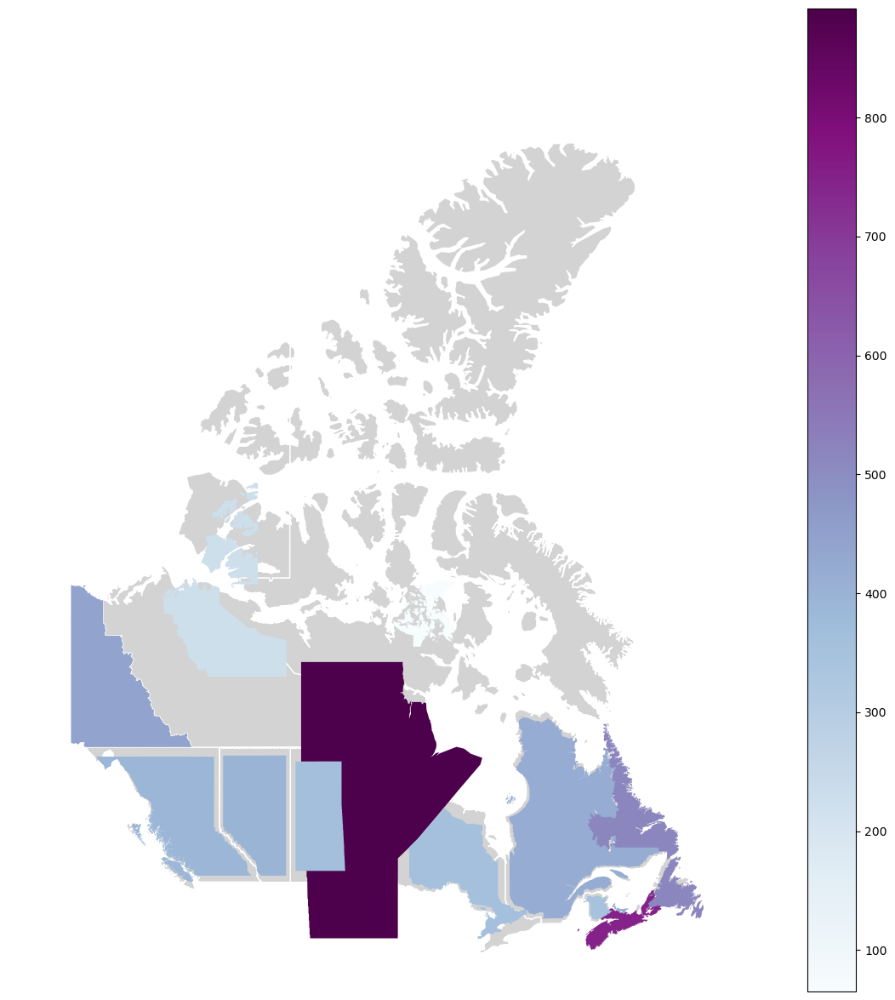

In [20]:
# !pip install geoplot
import geoplot


ax = geoplot.cartogram(
    dataset,
    scale='Injuries per 100,000 population', 
    legend=True,
    hue='Injuries per 100,000 population',
    legend_var='hue',
    cmap='BuPu',
    limits=(0.15,2),
    projection=geoplot.crs.WebMercator(),
    figsize=(15,15))
geoplot.polyplot(dataset, facecolor='lightgray', edgecolor='white', ax=ax)

In this cartogram map, we can see that Manitoba has a disproportionate share of the motor vehicle injuries.

## Bubble Map
Bubble maps show properties of the points being visualized through colour and size variations. In the example below, we vary Marker size by the Injuries per 100,000 population, while we colour provinces in blue and territories in red.

In [21]:
territories = ['Yukon Territory','Nunavut','Northwest Territories']

m = folium.Map(location=[58.4052172,-109.6062729],zoom_start=3, scrollWheelZoom=False, dragging=True)

for i,r in dataset.iterrows():
    folium.Circle(
        location=[r['geometry'].centroid.y,r['geometry'].centroid.x],
        radius = float(r['Injuries per 100,000 population'])*500,
        fill=True,
        popup=f"{r['name']}: {r['Injuries per 100,000 population']}",
        color = 'blue' if r['name'] not in territories else 'crimson'
        ).add_to(m)
m

## Hexagonal Binning

Hexagonal binning is a kind of aggregate visualization method where hexagons are drawn over the map, with each hexagon summarizing/abstracting the data that it contains.

The example below uses traffic accident data for Toronto, retrieved from the <a href="https://data.torontopolice.on.ca/pages/ksi", target="new">Toronto Police Service’s Public Safety Data Porta</a>. 

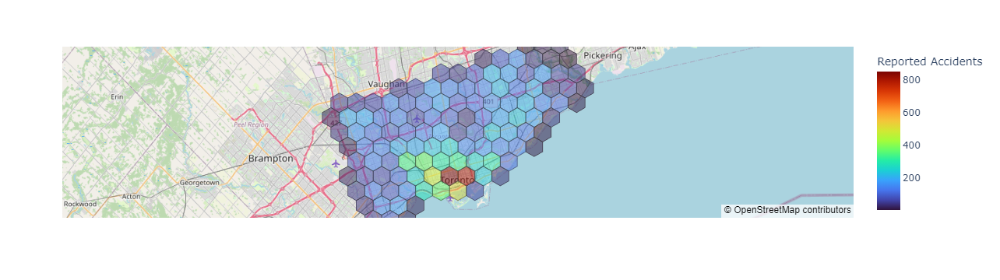

In [22]:
import plotly.figure_factory as ff

ksi = gpd.read_file(r"../Appendix B/data/Police/KSI.geojson")
fig = ff.create_hexbin_mapbox(
    data_frame=ksi, 
    lat="LATITUDE", 
    lon="LONGITUDE", 
    nx_hexagon=15, 
    opacity=0.5,
    min_count=1,
    labels={'color':'Reported Accidents'},
    color_continuous_scale='turbo'
    )

fig.update_layout(mapbox_style="open-street-map")
fig.show()

## Heat Map
Heat maps use a colour gradient to represent increasing density in data. As the underlying data points increases in density, so does the intensity (or shade) of the heatmap colour. Below is an example using the same Toronto traffic data from before.

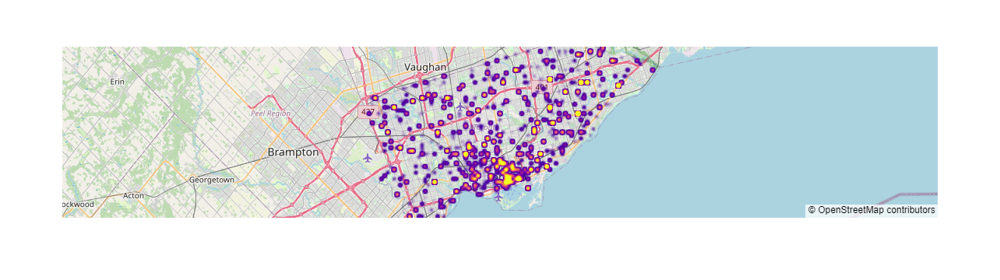

In [23]:
import plotly.express as px

fig = px.density_mapbox(
    data_frame=ksi,
    lat="LATITUDE", 
    lon="LONGITUDE",
    mapbox_style='open-street-map',
    radius=1,
    zoom=9,
)
fig.update_layout(coloraxis_showscale=False, hovermode=False)

## Cluster Map
Cluster maps aggregate data by merging neighouring points into one larger “cluster”. This generally improves performance when rendering larger datasets, and provides an easy-to-access indicator of density.

In [24]:
from folium.plugins import FastMarkerCluster
m = folium.Map(location=[43.6532,-79.3832], zoom_start=10, scrollWheelZoom=False, dragging=True)
FastMarkerCluster([[r.LATITUDE,r.LONGITUDE] for r in ksi.itertuples()]).add_to(m)

m

# using Pyrosm

In [25]:
# ! pip install pyrosm
import pyrosm
import matplotlib

# specify the region of interest
place_name = 'Toronto'
file_path = pyrosm.get_data(place_name)
print('Data downloaded to:', file_path)

Data downloaded to: C:\Users\Alaa\AppData\Local\Temp\pyrosm\Toronto.osm.pbf


In [26]:
# Initialises the OSM object that parses the generated .osm.pbf files
osm = pyrosm.OSM(file_path)
print('osm type:', type(osm))

osm type: <class 'pyrosm.pyrosm.OSM'>


In [27]:
# Get all walkable roads and the nodes 
nodes, edges = osm.get_network(nodes=True)

# Check first rows in the edge 
edges.head()

,access,area,bicycle,bridge,busway,cycleway,est_width,foot,footway,highway,...,width,id,timestamp,version,tags,osm_type,geometry,u,v,length
0,None,None,None,None,None,None,None,None,None,secondary,...,None,3944932,0,-1,None,way,"LINESTRING (-79.62414 43.75322, -79.62394 43.7...",20380873,7844864763,16.223
1,None,None,None,None,None,None,None,None,None,secondary,...,None,3944932,0,-1,None,way,"LINESTRING (-79.62394 43.75326, -79.62320 43.7...",7844864763,7246765043,62.644
2,None,None,None,None,None,None,None,None,None,secondary,...,None,3944937,0,-1,"{""hgv"":""no"",""old_ref"":""11A""}",way,"LINESTRING (-79.40508 43.69733, -79.40526 43.6...",1360124654,1360124656,17.473
3,None,None,None,None,None,None,None,None,None,secondary,...,None,3944937,0,-1,"{""hgv"":""no"",""old_ref"":""11A""}",way,"LINESTRING (-79.40526 43.69742, -79.40541 43.6...",1360124656,7620170939,13.183
4,None,None,None,None,None,None,None,None,None,secondary,...,None,3944937,0,-1,"{""hgv"":""no"",""old_ref"":""11A""}",way,"LINESTRING (-79.40541 43.69747, -79.40545 43.6...",7620170939,1360124657,3.415


In [28]:
# Create NetworkX graph
G = osm.to_graph(nodes, edges, graph_type="networkx")

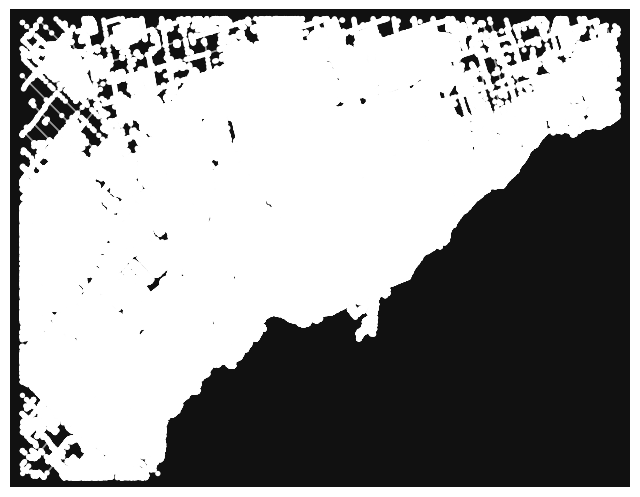

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [29]:
# Plot the graph with OSMnx
ox.plot_graph(G)

In [30]:
# Calculate shortest path between two points of interest
source_address = "CN Tower, Toronto"
target_address = "Scarborough Civic Centre, Toronto"

In [31]:
# get geocode using Nominatim available in osmnx
source = ox.geocode(source_address)
target = ox.geocode(target_address)

In [32]:
# Find the closest nodes from the graph
source_node = ox.nearest_nodes(G, source[1], source[0])
target_node = ox.nearest_nodes(G, target[1], target[0])

In [33]:
# Check the nodeids of the source/target node
print(source_node)
print(target_node)

3058329284
6191356493


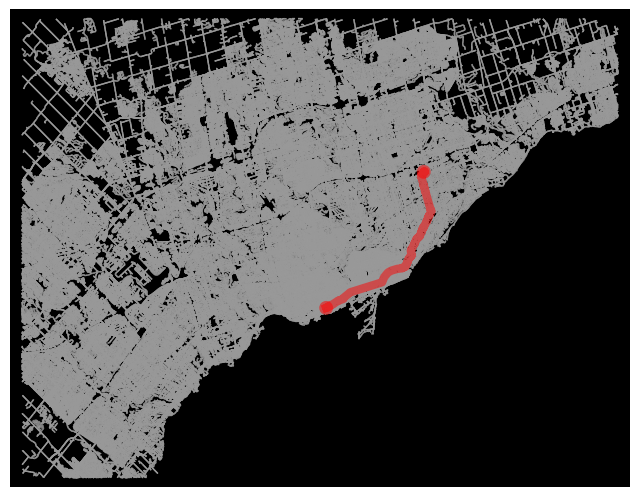

In [34]:
# Find shortest path (by distance)
import networkx as nx
route = nx.shortest_path(G, source_node, target_node, weight="length")
fig, ax = ox.plot_graph_route(G, route, route_linewidth=6, node_size=0, bgcolor='k')